In [376]:
#Import necessary packages igraph, scvelo, scanpy, anndata, pandas, os, numpy
!pip install -U scvelo
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline

import scvelo as scv
scv.logging.print_version()

#test whether igraph is imported
import igraph as ig

import loompy
import numpy as np
import scanpy as sc
import anndata
import pandas as pd
import os
import louvain
cwd = os.getcwd()
cwd

Requirement already up-to-date: scvelo in /usr/local/lib/python3.7/site-packages (0.2.2)


Running scvelo 0.2.2 (python 3.7.7) on 2020-08-11 21:31.


'/Users/whippoorwill/Desktop/Jupyter/velocity_Nick'

In [12]:


os.listdir(cwd)

['NSMG20_4.loom', 'NSMG20_3.loom', 'NSMG20_2.loom', 'NSMG20_1.loom']

Combine 4 loom files into 1


In [377]:
#files=os.listdir(cwd)
#newfile='nick.loom'
#loompy.combine(files,newfile,key="Accession")

Import the data file from inside the Jupyter folder as "adata"

In [437]:
adata = scv.read(filename="nick.loom",cache=True)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


If you get a message that "variable names are not unique", run the first line (make_unique). Also set verbosity and figure params for good visualization. 

In [438]:
adata.var_names_make_unique()
scv.settings.verbosity = 4  # show errors(0), warnings(1), info(2) and hints(3)
scv.settings.set_figure_params('scvelo')  # for beautified visualization

In [439]:
# show proportions of spliced/unspliced abundances
scv.utils.show_proportions(adata)
adata

Abundance of ['spliced', 'unspliced']: [0.64 0.36]


AnnData object with n_obs × n_vars = 23543 × 27771 
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

Open a file containing the names of the subset of cells that you want to use, if you need the cells subsetted. I will only use the mg subset (from R). 

In [440]:
anno = pd.read_table("nick_metadata.csv",header=0, sep=",")


print(anno['Cluster'][1])
print(type(anno['Cluster'][1]))

#make clusters into strings
clusterstring = []
for cluster in anno['Cluster']:
    cluster = str(cluster)
    clusterstring.append(cluster)

anno['Cluster'] = clusterstring

#make individual into strings
clusterstring = []
for cluster in anno['Individual']:
    cluster = str(cluster)
    clusterstring.append(cluster)

anno['Individual'] = clusterstring
    
print(type(anno['Cluster'][1]))
print(anno['Cluster'][1])
l = anno['Cellname']
print(l[1])

print(adata.var_names[1])
print (adata.obs_names[1])

0
<class 'numpy.int64'>
<class 'str'>
0
AAACGAAAGGTGCCAA-1
tmem39a
NSMG20_4:AAACGAACAATGTCACx


In [441]:
len(l)

6666

In [475]:
umap = pd.read_csv("nick_umap.csv")
pca = pd.read_csv("nick_pca.csv")
print(umap[0:2][1:5])
print(pca[0:2][1:5])

             Cellname    UMAP_1    UMAP_2
1  AAACGAAAGGTGCCAA-1 -6.868369  5.000635
             Cellname      PC_1      PC_2      PC_3      PC_4      PC_5  \
1  AAACGAAAGGTGCCAA-1  4.994257  9.473284 -1.315631  2.282698 -0.736246   

       PC_6      PC_7      PC_8      PC_9    ...        PC_41     PC_42  \
1 -2.486241  2.480413 -1.585819 -1.018412    ...    -0.395924 -1.405653   

      PC_43     PC_44    PC_45     PC_46     PC_47     PC_48     PC_49  \
1 -0.938864  0.134019 -0.07362  0.098406  0.874255 -0.511398  0.504082   

      PC_50  
1 -1.467514  

[1 rows x 51 columns]


Each line is formatted differently from the cellnames in the loom file, which is: LD5LD:---------x. The metadata is ---------- - LD5RC. Additionally, each line is imported with a trailing 'n'.

In [443]:
#n = [i.replace('\n','') for i in l] #initialize a new object 'n' that contains each line of 'l' without the trailing \n
#n[0] #read the second line to verify that this worked

In [476]:
l = list(anno['Cellname'])
print(type(l))
l[1]
a = list(umap['Cellname'])
a == l #Check that the cells in the umap list are in the same order as the annotation

<class 'list'>


True

In [477]:
#Now split each line and move the elements around to format the metadata in the same way as the loom object
j=0
for i in l:
    x = i.split("-")
    a = "NSMG20_" + x[1]+":"+x[0]+"x"
    l[j] = a
    j=j+1

In [478]:
anno.index = l
umap.index = l
pca.index = l
#sample_one_index = pd.DataFrame(sample_one.obs.index)
#sample_one = sample_one_index.rename(columns = {0:'Cell ID'}
#umap_ordered = sample_one_index.merge(umap,on="Cell ID")
#umap_ordered = umap_ordered.iloc[:,1:]
#sample_one.obsm['X_umap'] = umap_ordered.values

In [447]:
print(adata.obs_names)
print(l)

Index(['NSMG20_4:AAAGGTAAGTGCAAATx', 'NSMG20_4:AAACGAACAATGTCACx',
       'NSMG20_4:AAATGGAAGTGTACCTx', 'NSMG20_4:AAACGCTGTCTTCTATx',
       'NSMG20_4:AAAGGGCGTACCCAGCx', 'NSMG20_4:AAAGGGCGTTGTCCCTx',
       'NSMG20_4:AAAGTCCGTATCCCAAx', 'NSMG20_4:AAACGAACATGACTGTx',
       'NSMG20_4:AAAGGGCAGAGGACTCx', 'NSMG20_4:AAAGTCCAGCATGTTCx',
       ...
       'NSMG20_1:TTTGATCCAACGATTCx', 'NSMG20_1:TTTGATCCACCCTTGTx',
       'NSMG20_1:TTTGTTGTCTATACGGx', 'NSMG20_1:TTTCATGTCGGCTTGGx',
       'NSMG20_1:TTTCATGCACTTGGGCx', 'NSMG20_1:TTTGACTCATCCCACTx',
       'NSMG20_1:TTTGATCCATCATCCCx', 'NSMG20_1:TTTCGATTCTAATTCCx',
       'NSMG20_1:TTTGATCTCGCAATTGx', 'NSMG20_1:TTTCCTCTCATAGGCTx'],
      dtype='object', length=23543)
['NSMG20_1:AAACCCATCATTACCTx', 'NSMG20_1:AAACGAAAGGTGCCAAx', 'NSMG20_1:AAACGCTAGATGACCGx', 'NSMG20_1:AAACGCTCAAGCTGTTx', 'NSMG20_1:AAAGAACCAGATTCGTx', 'NSMG20_1:AAAGAACCAGCGTATTx', 'NSMG20_1:AAAGGGCAGAATACACx', 'NSMG20_1:AAAGGGCCAACGCCCAx', 'NSMG20_1:AAAGGGCGTTTGCAGTx', 'NSMG20_1:A

In [448]:
genes = pd.read_table("genes.csv",header=0, sep=",")
genes = list(genes['Genes'])


Now subset the adata object including on the cells that are in the metadata file (n). 

In [449]:
len(genes)
i = 0
k = []
for gene in genes:
    if gene not in adata.var_names:
        k.append(i)
    i = i+1
#genes = genes[adata.var_names]

In [450]:
print(i)
print(k)
genes[k[1]]


6001
[56, 138, 161, 179, 180, 191, 195, 201, 206, 219, 221, 227, 247, 248, 259, 280, 283, 293, 294, 295, 296, 298, 303, 305, 308, 369, 371, 373, 465, 605, 624, 659, 660, 662, 663, 664, 670, 734, 874, 999, 1001, 1003, 1030, 1253, 1256, 1323, 1424, 1543, 1589, 1759, 1792, 1907, 1934, 2009, 2094, 2097, 2098, 2099, 2100, 2102, 2105, 2106, 2107, 2108, 2217, 2336, 2372, 2389, 2403, 2728, 2773, 2898, 2972, 2989, 3046, 3064, 3065, 3262, 3270, 3292, 3402, 3425, 3507, 3510, 3543, 3698, 3766, 3845, 3930, 4090, 4144, 4230, 4245, 4310, 4329, 4382, 4513, 4514, 4751, 5040, 5148, 5152, 5184, 5280, 5333, 5508, 5512, 5554, 5560, 5562, 5590, 5591, 5597, 5637, 5665, 5674, 5679, 5766, 5785, 5858, 5890, 5896, 5900, 5902, 5903, 5906, 5907, 5908, 5909, 5911, 5912, 5916, 5928, 5929, 5931, 5933, 5934, 5935, 5936, 5937, 5938]


'si:dkeyp-4f2.3.1'

In [451]:
newgenes = [j for i, j in enumerate(genes) if i not in k]

In [452]:
print(len(genes),len(newgenes))

6001 5860


In [453]:
adata_subset = adata[l,newgenes]

In [454]:
adata = adata_subset

#check whether the number of cells and genes is correct now

Now write a file (cellnames.txt) with all the cellnames. This is strictly unnecessary but can be used to check against Seurat cellnames. 

In [455]:
print(adata.var_names[1])
print (adata.obs_names[1])
#with open('cellnames.txt','w') as f:
    #for item in adata.obs_names:
        #f.write("%s\n"%item)

#Check that the lists are ordered correctly
anno.index.all() == adata.obs_names.all()

CU856344.2
NSMG20_1:AAACGAAAGGTGCCAAx


True

In [456]:
print(type(anno))
anno[['Cluster','Individual','Cellname']][1:5]

<class 'pandas.core.frame.DataFrame'>


,Cluster,Individual,Cellname
NSMG20_1:AAACGAAAGGTGCCAAx,0,A,AAACGAAAGGTGCCAA-1
NSMG20_1:AAACGCTAGATGACCGx,0,A,AAACGCTAGATGACCG-1
NSMG20_1:AAACGCTCAAGCTGTTx,1,A,AAACGCTCAAGCTGTT-1
NSMG20_1:AAAGAACCAGATTCGTx,0,A,AAAGAACCAGATTCGT-1


In [457]:
print (adata.obs_keys) #find out whether there is any annotation yet in adata

<bound method AnnData.obs_keys of View of AnnData object with n_obs × n_vars = 6666 × 5860 
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'>


Add in metadata from the text file; needs to be separated by commas and you can use the headings in that file to pull out a column

In [458]:
adata.obs[['nCount_RNA','percent.mito','percent.ribo','Cluster','Individual']] = anno[['nCount_RNA','percent.mito','percent.ribo','Cluster','Individual']]

Trying to set attribute `.obs` of view, copying.


In [479]:
#Remove the cellnames column from umap and pca
umap = umap[['UMAP_1','UMAP_2']].values
pca = pca.iloc[:,1:30].values
print(pca[0:2][1:5])

print(type(umap))
print(type(pca))
print(umap)
print(pca)



adata.obsm['X_umap'] = umap
adata.obsm['X_pca'] = pca
adata #check whether attributes have been added

[[ 4.99425698  9.47328358 -1.31563099  2.28269797 -0.73624568 -2.4862406
   2.48041344 -1.58581877 -1.01841235  1.29764527  1.15667002 -0.1369403
  -0.10267013  2.09344192  1.26864011 -0.87345603 -1.30355574 -0.75623687
   0.12896108  0.43401766 -0.15759156  0.47737398 -0.0367968   0.09369702
  -1.08032876  0.48302877 -1.92706806 -0.03493793  1.53643951]]
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
[[  9.87272974 -10.31907133]
 [ -6.86836914   5.00063511]
 [ -7.82350306   7.60656639]
 ...
 [ -0.5382065    6.68518015]
 [ -6.08089737   3.98776527]
 [ -8.13130192   5.83369537]]
[[ -1.049766   -11.59737522  -4.44601417 ...  -0.7630334    0.77247584
    2.43912854]
 [  4.99425698   9.47328358  -1.31563099 ...  -1.92706806  -0.03493793
    1.53643951]
 [  6.37759916  13.28571497  -2.68751319 ...   2.61873701   0.71187374
    1.2627498 ]
 ...
 [  0.49800065  -5.25248245  28.28198665 ...  -0.79474409   1.02736639
   -0.37318434]
 [  4.91670643   7.17061378  -1.60346032 ...  -1.52089921  -0

AnnData object with n_obs × n_vars = 6666 × 5001 
    obs: 'nCount_RNA', 'percent.mito', 'percent.ribo', 'Cluster', 'Individual', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'velocity_gamma', 'velocity_r2', 'velocity_genes'
    uns: 'Cluster_colors', 'Individual_colors', 'neighbors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg'
    obsm: 'X_umap', 'X_pca'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 'distances', 'connectivities'

[[  9.87272974 -10.31907133]
 [ -6.86836914   5.00063511]
 [ -7.82350306   7.60656639]
 ...
 [ -0.5382065    6.68518015]
 [ -6.08089737   3.98776527]
 [ -8.13130192   5.83369537]]


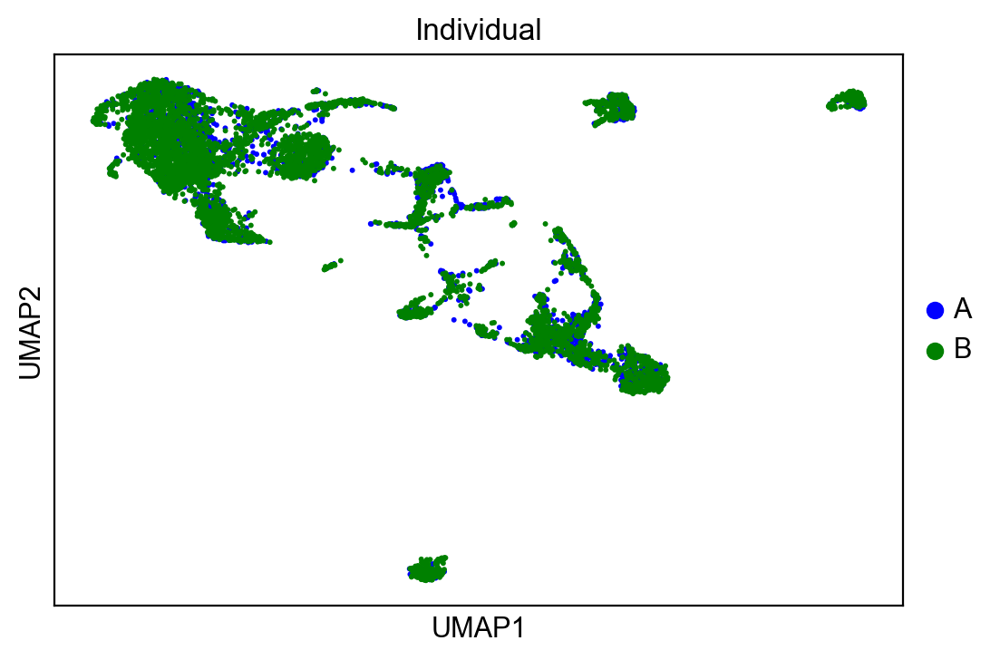

In [482]:
print(adata.obsm['X_umap'])
sc.pl.umap(adata,color = 'Individual',palette=['blue','green']) #show umap

Filter and normalize the adata object, then calculate "moments" for each cell. You can define the number of genes kept with shared counts and n_top_genes. Use method "sklearn" rather than "umap" because "umap" throws an error. 

In [464]:
x=adata.layers['spliced']
print(x.sum(1).A1)

x=adata.layers['unspliced']
x.sum(1).A1

[ 456 1196 1492 ... 1604 1187 1434]


array([136, 173, 234, ..., 208, 163, 252], dtype=uint64)

In [465]:
scv.pp.filter_genes(adata,min_counts = 1)
adata


Filtered out 404 genes that are detected 1 counts (spliced).


AnnData object with n_obs × n_vars = 6666 × 5456 
    obs: 'nCount_RNA', 'percent.mito', 'percent.ribo', 'Cluster', 'Individual', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'Cluster_colors', 'Individual_colors'
    obsm: 'X_umap', 'X_pca'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [466]:
scv.pp.normalize_per_cell(adata,enforce = True,use_initial_size=True) #enforce means recalculate
#adata.obs['n_counts']

Normalized count data: X, spliced, unspliced.


In [467]:
print(adata.layers['spliced'][1:100,1:5])
adata.n_vars

  (0, 2)	11.711538
  (1, 2)	7.3763404
  (2, 1)	1.8806391
  (2, 2)	11.283834
  (3, 2)	11.429932
  (4, 2)	1.3010403
  (5, 2)	11.509449
  (6, 2)	10.977273
  (7, 2)	29.697544
  (8, 2)	10.15736
  (9, 2)	35.33775
  (10, 2)	7.7010903
  (11, 2)	10.513135
  (12, 2)	21.431229
  (13, 1)	1.725
  (13, 2)	6.9
  (14, 2)	2.552296
  (15, 1)	0.7779938
  (15, 2)	20.227839
  (16, 1)	2.552296
  (16, 2)	20.418367
  (17, 2)	8.873614
  (18, 2)	25.099049
  (19, 2)	1.7994604
  (20, 2)	7.985747
  :	:
  (77, 2)	40.836735
  (78, 2)	9.43868
  (79, 2)	7.352459
  (80, 1)	1.9733728
  (80, 2)	1.9733728
  (81, 2)	5.52
  (82, 2)	17.911764
  (83, 2)	2.6054688
  (84, 2)	8.580618
  (85, 2)	16.050802
  (86, 1)	0.29662022
  (86, 2)	33.221466
  (87, 2)	8.53669
  (87, 3)	1.7073379
  (88, 2)	30.318182
  (89, 2)	3.5478723
  (90, 2)	5.8459935
  (91, 2)	30.0
  (92, 2)	1.4416426
  (93, 2)	11.189189
  (94, 2)	8.042604
  (95, 2)	29.513275
  (96, 2)	12.993506
  (97, 2)	20.61252
  (98, 2)	24.456667


5456

In [470]:
scv.pp.filter_genes_dispersion(adata,flavor = 'seurat',n_top_genes=5000)
adata


Exctracted 5001 highly variable genes.


AnnData object with n_obs × n_vars = 6666 × 5001 
    obs: 'nCount_RNA', 'percent.mito', 'percent.ribo', 'Cluster', 'Individual', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'Cluster_colors', 'Individual_colors'
    obsm: 'X_umap', 'X_pca'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [471]:
print(max(adata.var['dispersions_norm']))
print(min(adata.var['dispersions_norm']))
print(sum(adata.var['dispersions_norm'])/len(adata.var['dispersions_norm']))
len(adata.var['dispersions_norm'])
x = sorted(adata.var['dispersions_norm'],reverse=True)

7.5906195640563965
-1.2307589054107666
0.16391024342990662


In [483]:
#scv.pp.log1p(adata)
adata.obsm['X_umap']

array([[  9.87272974, -10.31907133],
       [ -6.86836914,   5.00063511],
       [ -7.82350306,   7.60656639],
       ...,
       [ -0.5382065 ,   6.68518015],
       [ -6.08089737,   3.98776527],
       [ -8.13130192,   5.83369537]])

In [472]:
scv.pp.neighbors(adata,n_neighbors = 80, n_pcs = 10, method = 'sklearn',use_rep = "X_pca",random_state = 1)
scv.pp.moments(adata, n_neighbors=80, n_pcs=10,method='sklearn',mode = 'connectivities',use_rep = "X_pca")
scv.tl.velocity_graph(adata)
scv.tl.velocity_embedding(adata, basis='umap')

computing neighbors
    finished (0:00:01) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:07) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:04:18) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding


KeyError: '[6616 6605 6577 6575 6559 6535 6512 6511 6506 6489 6472 6451 6440 6425\n 6396 6353 6271 6259 6226 6219 6207 6178 6175 6164 6158 6124 6123 6103\n 6079 6069 6068 6041 6024 6022 6015 6012 6003 5998 5983 5969 5934 5915\n 5904 5866 5849 5832 5805 5794 5762 5759 5673 5649 5643 5623 5611 5610\n 5556 5547 5538 5517 5482 5477 5471 5460 5459 5456 5421 5419 5413 5406\n 5402 5393 5381 5282 5278 5272 5261 5258 5247 5230 5226 5193 5145 5128\n 5122 5096 5070 5055 5042 5022 4944 4900 4886 4873 4848 4847 4832 4826\n 4796 4722 4651 4649 4592 4578 4533 4512 4501 4458 4454 4443 4402 4385\n 4338 4309 4292 4273 4260 4213 4204 4191 4180 4179 4177 4168 4147 4117\n 4095 4086 4073 4057 4045 4042 4022 4018 4016 4002 3931 3922 3919 3881\n 3874 3871 3870 3868 3854 3758 3749 3734 3727 3693 3682 3671 3650 3649\n 3628 3619 3616 3571 3557 3547 3442 3413 3376 3374 3323 3306 3284 3250\n 3241 3210 3207 3185 3173 3172 3167 3165 3163 3123 3113 3105 3098 3091\n 3090 3003 2979 2962 2813 2810 2806 2783 2754 2753 2749 2748 2745 2689\n 2686 2680 2670 2631 2630 2607 2550 2535 2514 2499 2477 2462 2461 2436\n 2417 2413 2398 2389 2367 2365 2333 2311 2271 2257 2220 2216 2203 2196\n 2180 2176 2129 2117 2097 2063 2041 2033 2014 2012 2008 1989 1972 1951\n 1946 1918 1850 1819 1815 1788 1785 1767 1748 1745 1700 1692 1688 1684\n 1665 1662 1653 1620 1603 1558 1541 1525 1509 1478 1471 1460 1449 1429\n 1381 1360 1358 1352 1330 1305 1291 1279 1274 1251 1216 1196 1187 1175\n 1160 1103 1028 1014 1013 1003  996  985  959  953  935  929  903  899\n  876  871  860  817  799  777  763  757  755  743  722  721  715  709\n  670  658  645  642  610  606  587  582  570  569  559  556  480  462\n  393  385  335  330  316  306  286  280  226  210  184  153  148  142\n  141  118  113  108   99   96   52   43   18] not in index'

In [484]:
scv.tl.velocity_embedding(adata, basis='umap')

computing velocity embedding
    finished (0:00:01) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


In [485]:
print(adata)
adata.obs['Cluster'][1:3]

AnnData object with n_obs × n_vars = 6666 × 5001 
    obs: 'nCount_RNA', 'percent.mito', 'percent.ribo', 'Cluster', 'Individual', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'velocity_gamma', 'velocity_r2', 'velocity_genes'
    uns: 'Cluster_colors', 'Individual_colors', 'neighbors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg'
    obsm: 'X_umap', 'X_pca', 'velocity_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 'distances', 'connectivities'


NSMG20_1:AAACGAAAGGTGCCAAx    0
NSMG20_1:AAACGCTAGATGACCGx    0
Name: Cluster, dtype: category
Categories (16, object): [0, 1, 2, 3, ..., 12, 13, 14, 15]

In [486]:
a = adata.var['velocity_genes']
b = adata.var['velocity_gamma']
c = adata.var['velocity_r2']
d = adata.layers['velocity']
print([b,c,d])

[phtf2                0.088421
CU856344.2           0.058514
si:ch211-51e12.7     0.085420
rpl18a               0.005774
dpysl5b              0.014669
crybg1b              0.000000
mrap2b               0.139265
si:ch211-117i20.2    0.073130
ptn                  0.053387
pwp1                 0.325535
cmah                 1.262347
glipr1a              0.268138
phlda1               0.000000
nap1l1               0.094772
e2f7                 0.335756
fgd4b                0.095255
grm8a                1.587401
asb15b               0.000000
CR293509.1           0.088569
cd9b                 0.016425
ano2                 0.456006
zgc:162331           0.061449
ptprz1b              0.215377
rad51ap1             0.124915
si:ch211-214j24.9    0.133631
apex1                0.068577
si:dkey-14d8.22      0.222589
mapk12b              0.050249
si:dkey-14d8.6       0.000000
foxp2                0.227023
                       ...   
zgc:174680           0.000000
dicp1.16             0.176183
zgc:15290

In [487]:
adata.layers['velocity']
sum(adata.var['velocity_genes'])

2643

If you want to look at the velocity of a single gene, put it in the code below.

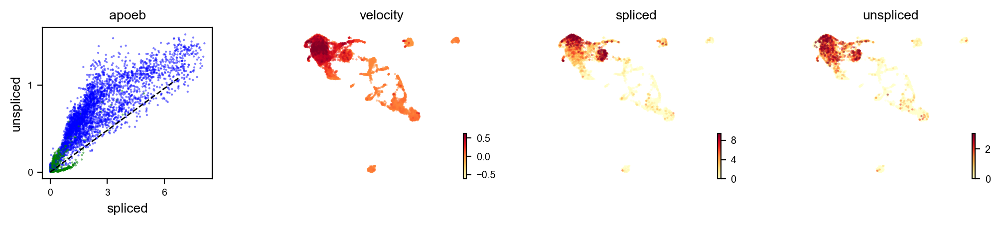

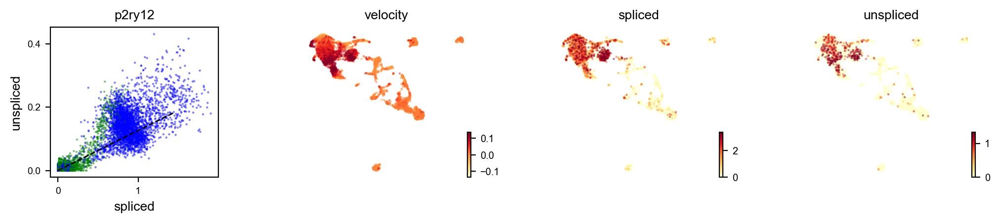

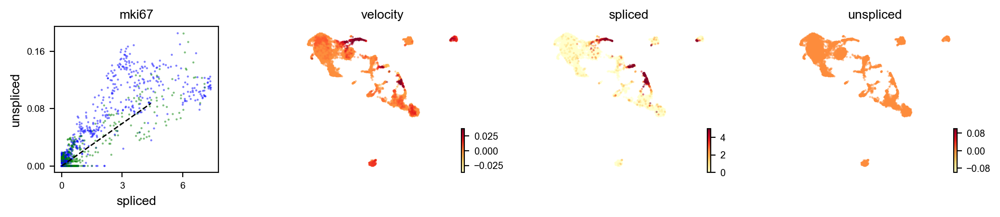

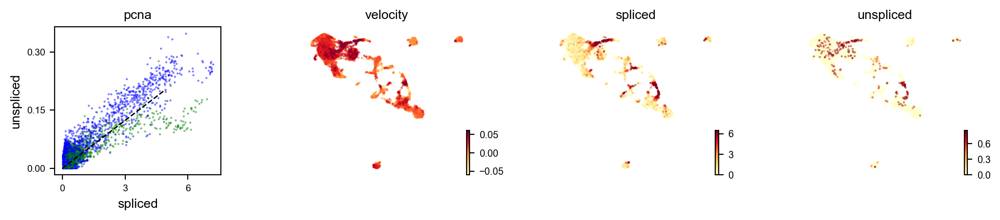

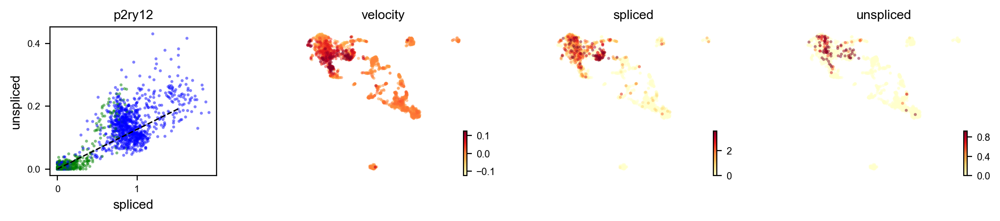

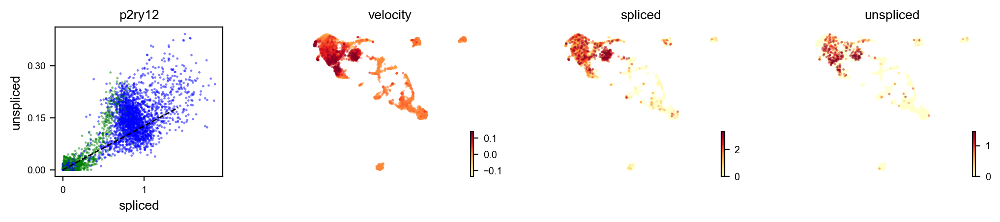

In [492]:
scv.pl.velocity(adata,var_names = "apoeb",show=True,color='Cluster',layers=['velocity', 'spliced','unspliced'],color_map = 'YlOrRd')
scv.pl.velocity(adata,var_names = "p2ry12",show=True,color = 'Cluster',layers=['velocity', 'spliced','unspliced'],color_map = 'YlOrRd')
scv.pl.velocity(adata,var_names = "mki67",show=True,color = 'Cluster',layers=['velocity', 'spliced','unspliced'],color_map = 'YlOrRd')
scv.pl.velocity(adata,var_names = "pcna",show=True,color = 'Cluster',layers=['velocity', 'spliced','unspliced'],color_map = 'YlOrRd')
scv.pl.velocity(adata[adata.obs["Individual"] == "A",:],var_names = "p2ry12",show = True, color = 'Cluster',layers=['velocity', 'spliced','unspliced'],color_map = 'YlOrRd')
scv.pl.velocity(adata[adata.obs["Individual"] == "B",:],var_names = "p2ry12",show = True, color = 'Cluster',layers=['velocity', 'spliced','unspliced'],color_map = 'YlOrRd')

saving figure to file ./figures/scvelo_apoeb.pdf


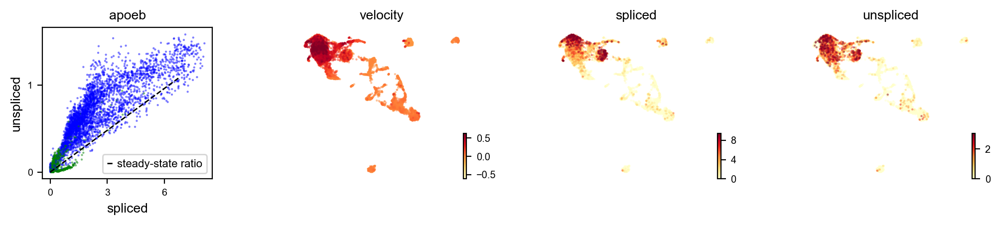

saving figure to file ./figures/scvelo_glula.pdf


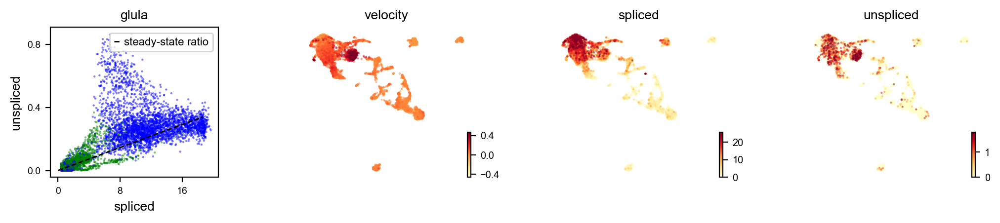

saving figure to file ./figures/scvelo_ccl34b.1.pdf


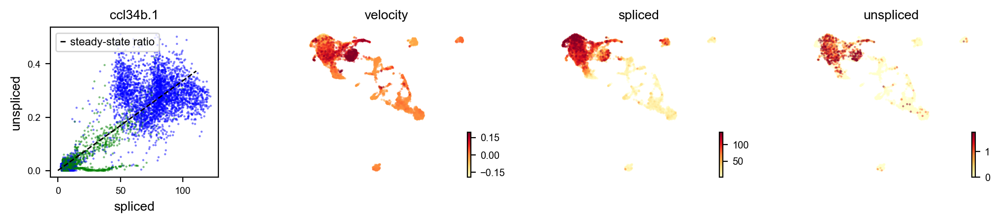

saving figure to file ./figures/scvelo_psap.pdf


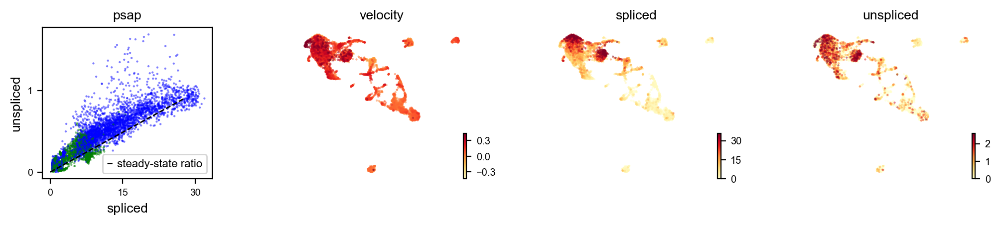

saving figure to file ./figures/scvelo_abhd12.pdf


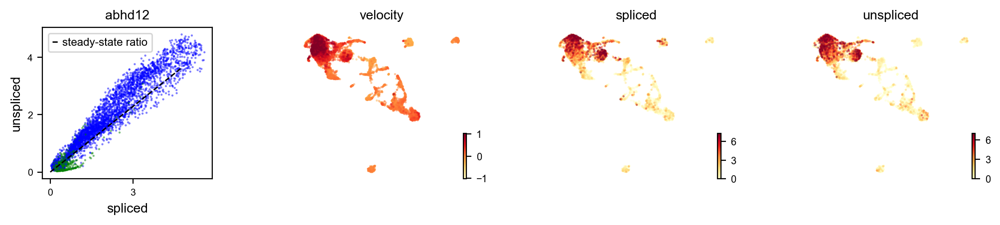

saving figure to file ./figures/scvelo_bzw2.pdf


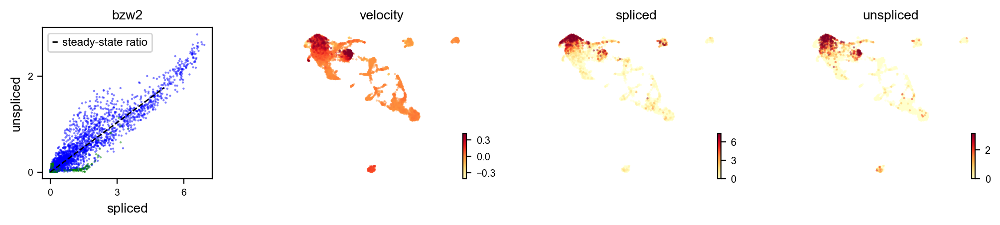

saving figure to file ./figures/scvelo_g0s2.pdf


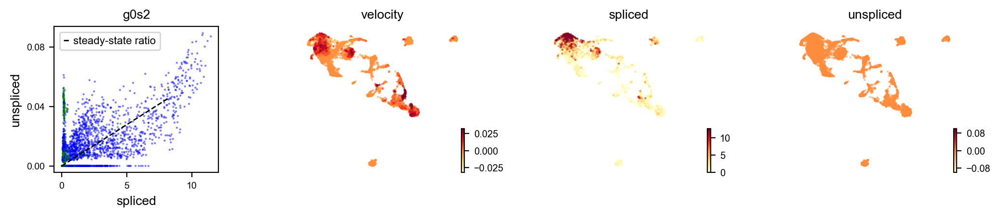

saving figure to file ./figures/scvelo_slc40a1.pdf


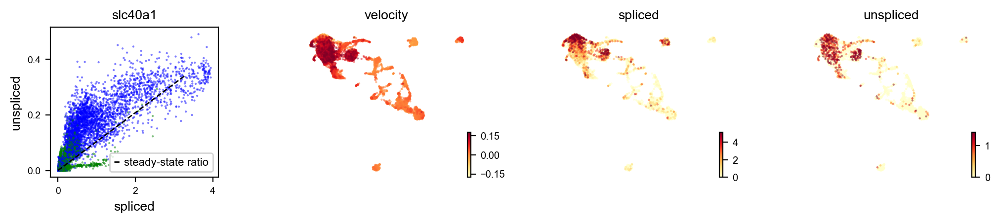

saving figure to file ./figures/scvelo_ccl19a.1.pdf


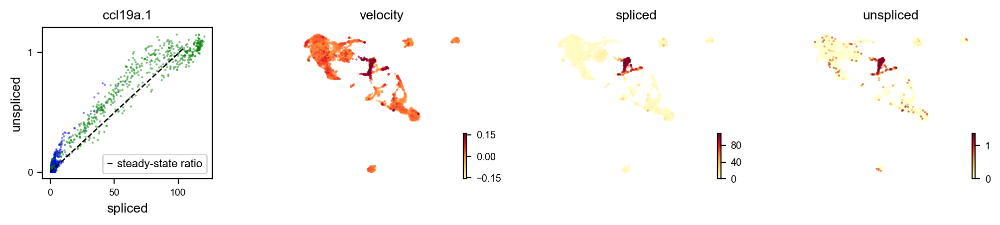

saving figure to file ./figures/scvelo_cd74a.pdf


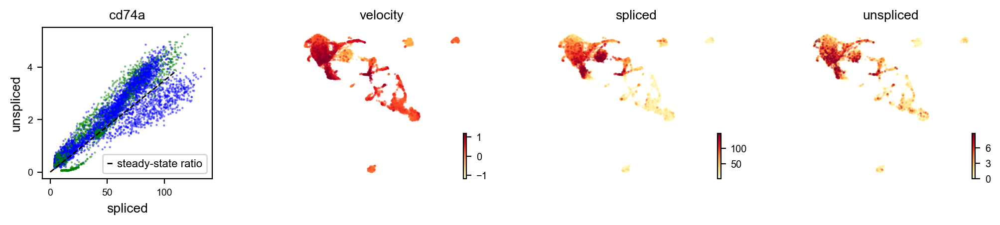

saving figure to file ./figures/scvelo_cd74b.pdf


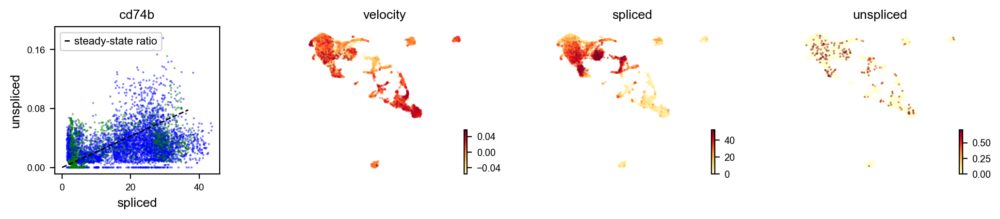

saving figure to file ./figures/scvelo_siglec15l.pdf


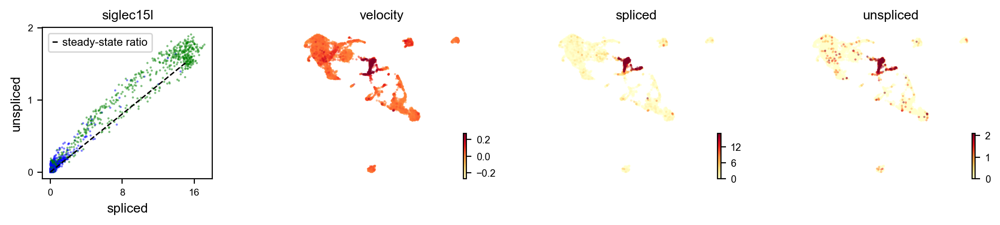

saving figure to file ./figures/scvelo_mki67.pdf


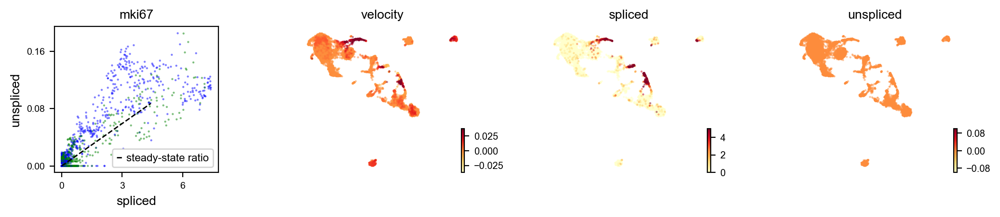

saving figure to file ./figures/scvelo_pcna.pdf


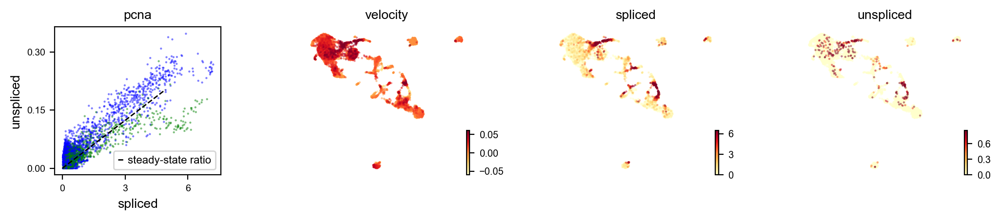

In [493]:
#Print graphs
genes = ['apoeb','glula','ccl34b.1','psap','abhd12','bzw2','g0s2','slc40a1','ccl19a.1','cd74a','cd74b','siglec15l','mki67','pcna']

for gene in genes:
    scv.pl.velocity(adata,var_names = gene,legend_loc = 'right margin',show = True, color = 'Cluster',layers=['velocity', 'spliced','unspliced'],color_map = 'YlOrRd',save = gene)


In [494]:
adata.obs_keys()

['nCount_RNA',
 'percent.mito',
 'percent.ribo',
 'Cluster',
 'Individual',
 'initial_size_spliced',
 'initial_size_unspliced',
 'initial_size',
 'n_counts',
 'velocity_self_transition']

In [498]:
scv.pl.velocity_embedding_stream(adata,
                                 linewidth = 1,
                                 size=8,
                                 min_mass = 0.5,
                                 density = 0.5,
                                 basis = "umap",
                                 color = ['Cluster'],
                                 palette = ['darkgoldenrod','y','forestgreen','mediumseagreen','lightcoral','lightskyblue','mediumorchid','hotpink'],
                                 alpha=1,
                                 legend_loc = 'right margin',
                                 legend_fontsize = 20,
                                 title = "All",
                                 fontsize = 10,
                                 save = "stream_nick.png",
                                 arrow_color = "black",
                                 smooth = True,
                                 figsize = (3,3),
                                 dpi = 1200
                                )

figure cannot be saved as pdf, using png instead.
saving figure to file ./figures/scvelo_stream_nick.pdf.png


In [500]:
scv.pl.velocity_embedding_stream(adata,
                                 linewidth = 0.8,
                                 size = 8,
                                 min_mass = 1,
                                 density = 0.5,
                                 basis = "umap",
                                 color = ['Cluster'],
                                 palette = ['darkgoldenrod','y','forestgreen','mediumseagreen','lightcoral','lightskyblue','mediumorchid','hotpink'],
                                 groups = ['0','2','5','6','12'],
                                 alpha=1,
                                 legend_loc = 'right margin',
                                 legend_fontsize = 20,
                                 title = "all_zoom",
                                 arrow_color = 'black',
                                 fontsize = 10,
                                 figsize = (3,3),
                                 smooth = True,
                                 dpi = 1200,
                                 save = "scvelo_microglia.png"
                                )

saving figure to file ./figures/scvelo_scvelo_microglia.png


In [45]:
adata.uns

OrderedDict([('neighbors',
              {'params': {'n_neighbors': 30, 'method': 'sklearn'},
               'distances': <12330x12330 sparse matrix of type '<class 'numpy.float64'>'
               	with 369900 stored elements in Compressed Sparse Row format>,
               'connectivities': <12330x12330 sparse matrix of type '<class 'numpy.float64'>'
               	with 527694 stored elements in Compressed Sparse Row format>,
               'indices': array([[ 1283,  1367,  7119, ...,  5022, 12298,  5687],
                      [11967,  2861,   970, ..., 12069,  5306,  5740],
                      [ 4363,  1445,  9297, ...,  2098,  2579,  2829],
                      ...,
                      [10065,  5682,  1291, ...,    34,  8951,   599],
                      [11509, 10593, 11301, ...,  8833,  9547,  3059],
                      [11716, 11936, 11542, ...,  7238,  7130,  5215]])}),
             ('velocity_settings',
              {'mode': 'stochastic', 'fit_offset': True, 'perc':

saving figure to file ./figures/scvelo_Nick_stream_2.png


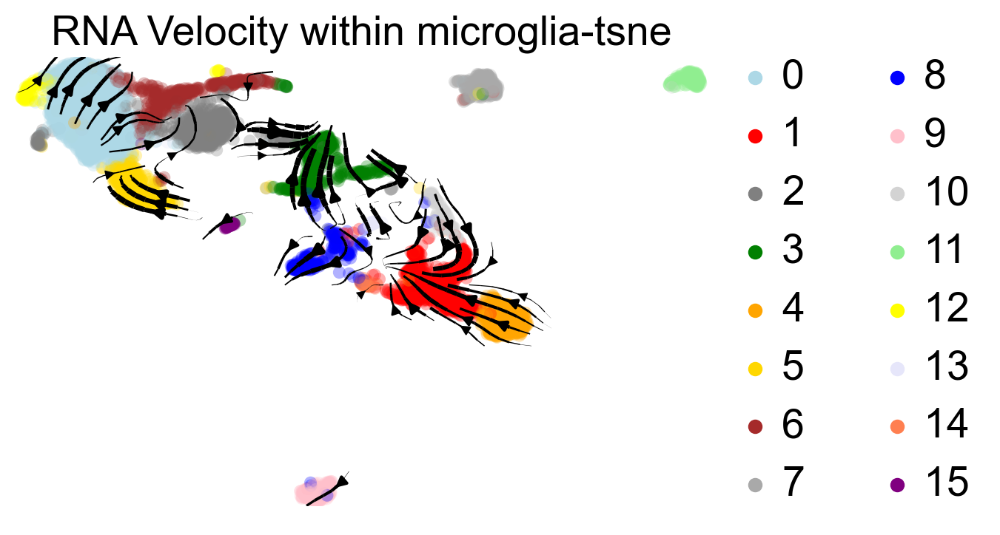

In [517]:
scv.pl.velocity_embedding_stream(adata,
                                 linewidth = 2,
                                 basis = "umap",
                                 color = ['Cluster'],
                                 palette = ['lightblue','red','grey','green','orange','gold','brown','darkgrey','blue','pink','lightgrey','lightgreen','yellow','lavender','coral','purple'],
                                 alpha=.3,
                                 legend_loc = 'right margin',
                                 legend_fontsize = 20,
                                 title = "RNA Velocity within microglia-tsne",
                                 fontsize = 20,
                                 save = "Nick_stream_2.png"
                                )

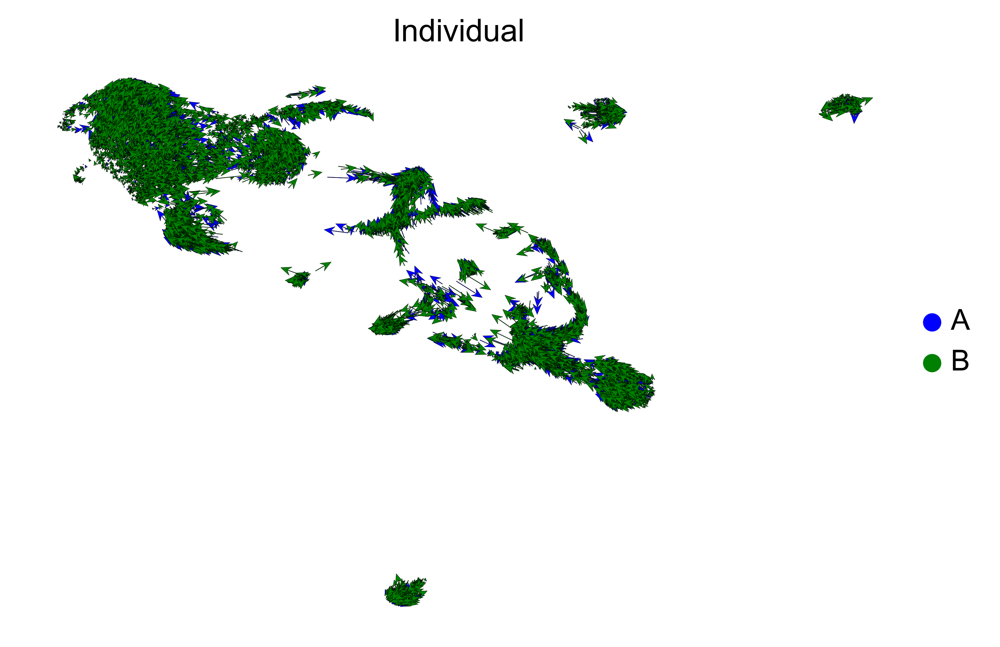

In [504]:
scv.pl.velocity_embedding(adata, basis='umap', legend_loc = 'right margin',color = ['Individual'],size = 1, arrow_length=8, arrow_size=2, dpi=300)


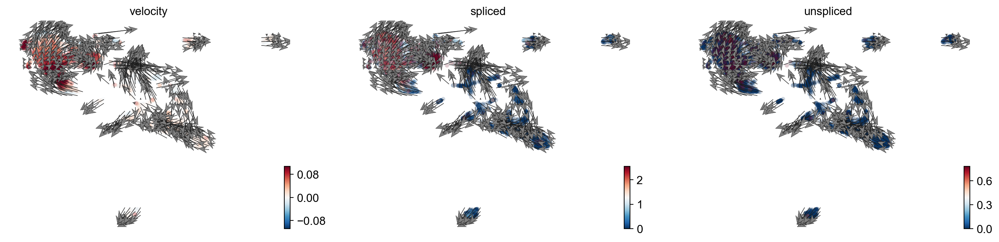

In [506]:
scv.pl.velocity_embedding_grid(adata,
                               color=['p2ry12'], 
                               layer=['velocity', 'spliced','unspliced'], 
                               arrow_size=5,
                               arrow_length = 10,
                               alpha = 0.2,
                               perc=95,
                               colorbar=True)

In [507]:
scv.tl.rank_velocity_genes(adata, groupby = 'Cluster')
adata.uns['rank_velocity_genes']['names']

ranking velocity genes
    finished (0:00:09) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


rec.array([('qki2', 'itga1', 'glula', 'znf804a', 'bcl11ba', 'ptprfb', 'dbf4b', 'ppp3ca', 'si:dkey-261h17.1', 'BX248410.3', 'slc6a15', 'srrm4', 'stmn1a', 'ryr3', 'il34', 'dachd'),
           ('apoeb', 'BX120005.1', 'plecb', 'dab2ipa', 'sorl1', 'myh9a', 'BX005003.1', 'si:dkey-79d12.6', 'mpl', 'ca10a', 'cita', 'stx1b', 'cacna1ab', 'nrp2b', 'itga6l', 'crhr1'),
           ('ctsla', 'efna2a', 'rgcc', 'plxna3', 'tox', 'trpv1', 'si:dkeyp-121d4.3', 'dscaml1', 'fgd4a', 'si:ch211-194c3.5', 'FP016106.1', 'arhgap42a', 'bcam', 'nrxn1a', 'erc2', 'ppdpfa'),
           ('sdc4', 'tnikb', 'pdk2b', 'msi1', 'gpr184', 'arhgef15', 'top2a', 'kcnd2', 'atp1b2a', 'anks1b', 'dbf4b', 'dennd2da', 'gria1a', 'bcl11aa', 'vav3b', 'si:ch211-9d9.1'),
           ('havcr1', 'tcf7', 'spon1a', 'fnbp1l', 'roraa', 'ptgis', 'kif20bb', 'fgf13a', 'DTX4', 'syt7b', 'il2rb', 'unc119b', 'fat1a', 'foxp4', 'si:dkey-78l4.5', 'adam19b'),
           ('plecb', 'cyth4a', 'zgc:66433', 'myt1b', 'runx3', 'acsl4b', 'cited4a', 'mapk10', 'gpc1b',

In [508]:
adata.write("adata_Nick.h5ad",compression = "gzip")